# Analyse Exploratoire des images

## Import des bibliothèques et vérification du dataset

On commence par importer les bibliothèques nécessaires et vérifier notre dossier d'images contient bien les fichiers.

In [8]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

In [9]:
# chemin vers le dossier d'images
data_path = Path('data/img')
    
# selection des fichiers .jpg
image_files = list(data_path.glob('*.jpg'))

print(f"Nombre total d'images : {len(image_files)}")
print(f"Premiers fichiers : {[f.name for f in image_files[:5]]}")

Nombre total d'images : 27690
Premiers fichiers : ['AACHEN_Hans_von-Allegory.jpg', 'AACHEN_Hans_von-Allegory_of_Peace_Art_and_Abundance.jpg', 'AACHEN_Hans_von-Anna_of_Tyrol.jpg', 'AACHEN_Hans_von-A_Couple_in_a_Tavern.jpg', 'AACHEN_Hans_von-Bacchus_Ceres_and_Cupid.jpg']


## Visualisation d'un échantillon d'images

On va afficher quelques d'images pour avoir un premier aperçu visuel du dataset de peintures.

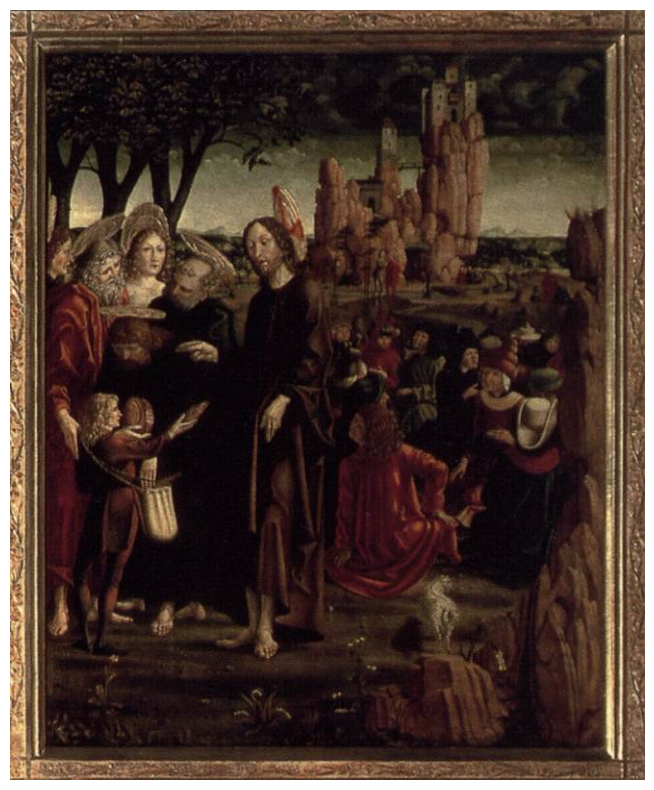

Image affichée : PACHER_Michael-St_Wolfgang_Altarpiece_The_Miracle_of_the_Bread.jpg
Dimensions : 660 x 801 pixels


In [10]:
# Sélectionner une image aléatoire
sample_img = np.random.choice(image_files)

# Charger et afficher l'image
img = Image.open(sample_img)

plt.figure(figsize=(10, 8))
plt.imshow(img)
plt.axis('off')
plt.tight_layout()
plt.show()

print(f"Image affichée : {sample_img.name}")
print(f"Dimensions : {img.size[0]} x {img.size[1]} pixels")

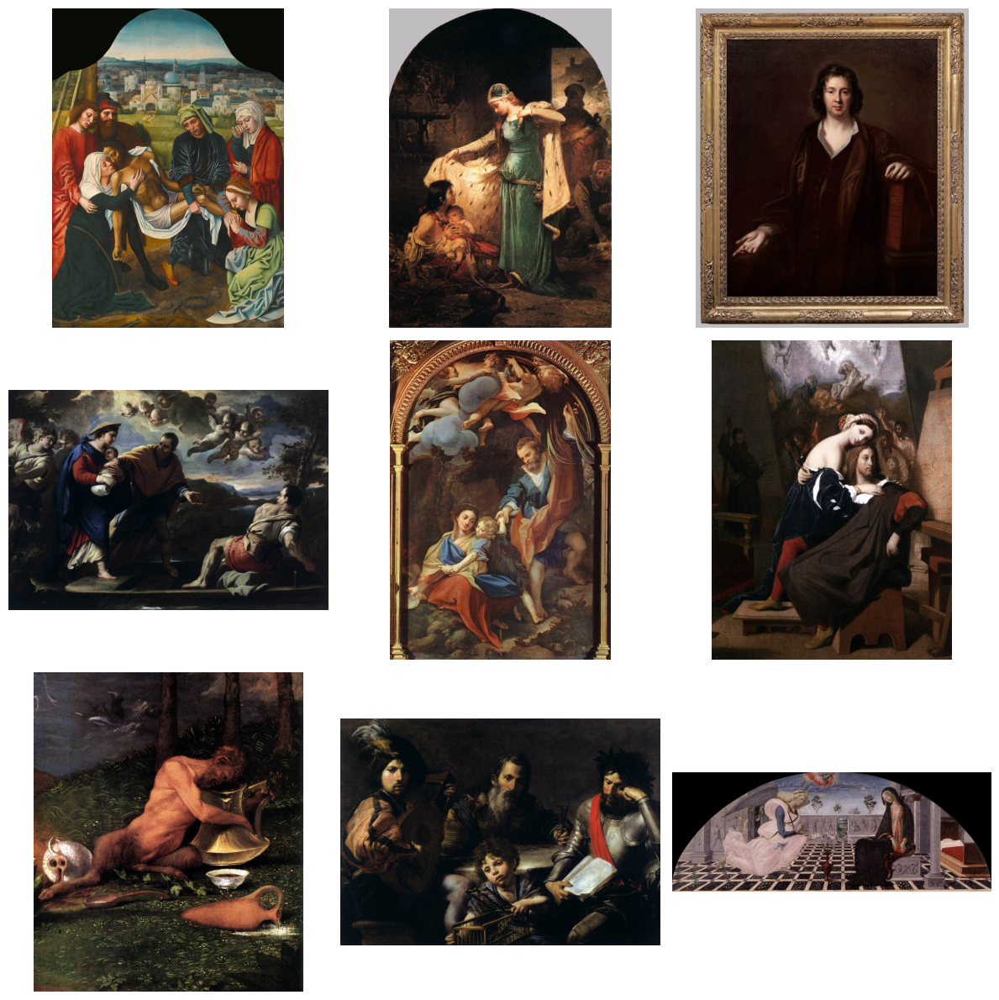

In [11]:
# échantillon aléatoire d'images
n_samples = 9
sample_files = np.random.choice(image_files, size=min(n_samples, len(image_files)), replace=False)

# grille de visualisation
fig, axes = plt.subplots(3, 3, figsize=(12, 12))
axes = axes.flatten()

for idx, img_path in enumerate(sample_files):
    img = Image.open(img_path)
    axes[idx].imshow(img)
    axes[idx].axis('off')

plt.tight_layout()
plt.show()

## Analyse des dimensions des images

On va maintenant analyser les dimensions (largeur, hauteur) d'un échantillon de 100 images pour comprendre la distribution des tailles dans notre dataset.

In [12]:
# Collecter les dimensions de toutes les images
dimensions = []

for img_path in image_files:
    try:
        with Image.open(img_path) as img:
            width, height = img.size
            dimensions.append({
                'filename': img_path.name,
                'width': width,
                'height': height,
                'aspect_ratio': width / height
            })
    except Exception as e:
        print(f"Erreur avec {img_path.name}: {e}")

# Créer un DataFrame pour l'analyse
df_dims = pd.DataFrame(dimensions)

In [13]:
# Statistiques descriptives simplifiées
print("STATISTIQUES DES DIMENSIONS\n")
print(df_dims[['width', 'height']].describe().round(0).astype(int))

# Infos complémentaires
most_frequent = df_dims.groupby(['width', 'height']).size().idxmax()
n_unique = df_dims.groupby(['width', 'height']).size().shape[0]

print(f"\nDimension la plus fréquente : {most_frequent[0]} x {most_frequent[1]} px")
print(f"Dimensions uniques : {n_unique} sur {len(df_dims)} images ({n_unique/len(df_dims)*100:.1f}%)")

STATISTIQUES DES DIMENSIONS

       width  height
count  27690   27690
mean    1019    1042
std      263     258
min      217     133
25%      822     852
50%     1000    1007
75%     1200    1200
max     2547    2544

Dimension la plus fréquente : 1300 x 867 px
Dimensions uniques : 19337 sur 27690 images (69.8%)


Conclusions : 
- Dataset très hétérogène, presque chaque image a une taille différente
- Images majoritairement carrées/légèrement verticales
- Grande variabilité (écart-type ~260px)
- **Action requise :** Normalisation pour le GAN (target : 256x256 ou 512x512)
- **Attention :** Certaines images très petites risquent une perte de qualité

## Analyse des ratios d'aspect

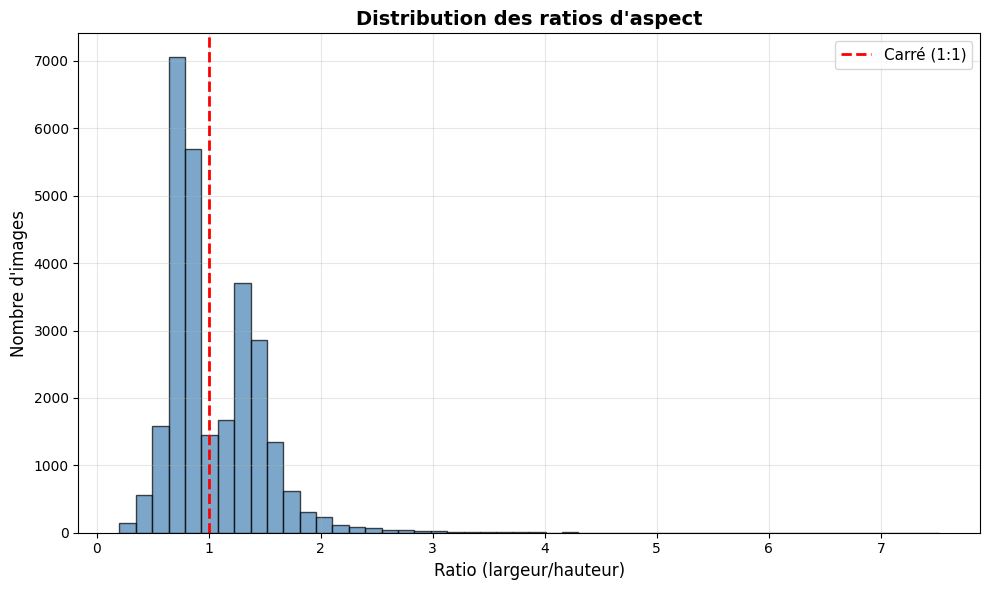

In [14]:
# Histogramme des ratios d'aspect
plt.figure(figsize=(10, 6))
plt.hist(df_dims['aspect_ratio'], bins=50, edgecolor='black', alpha=0.7, color='steelblue')
plt.axvline(1.0, color='red', linestyle='--', linewidth=2, label='Carré (1:1)')
plt.xlabel('Ratio (largeur/hauteur)', fontsize=12)
plt.ylabel('Nombre d\'images', fontsize=12)
plt.title('Distribution des ratios d\'aspect', fontsize=14, fontweight='bold')
plt.legend(fontsize=11)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

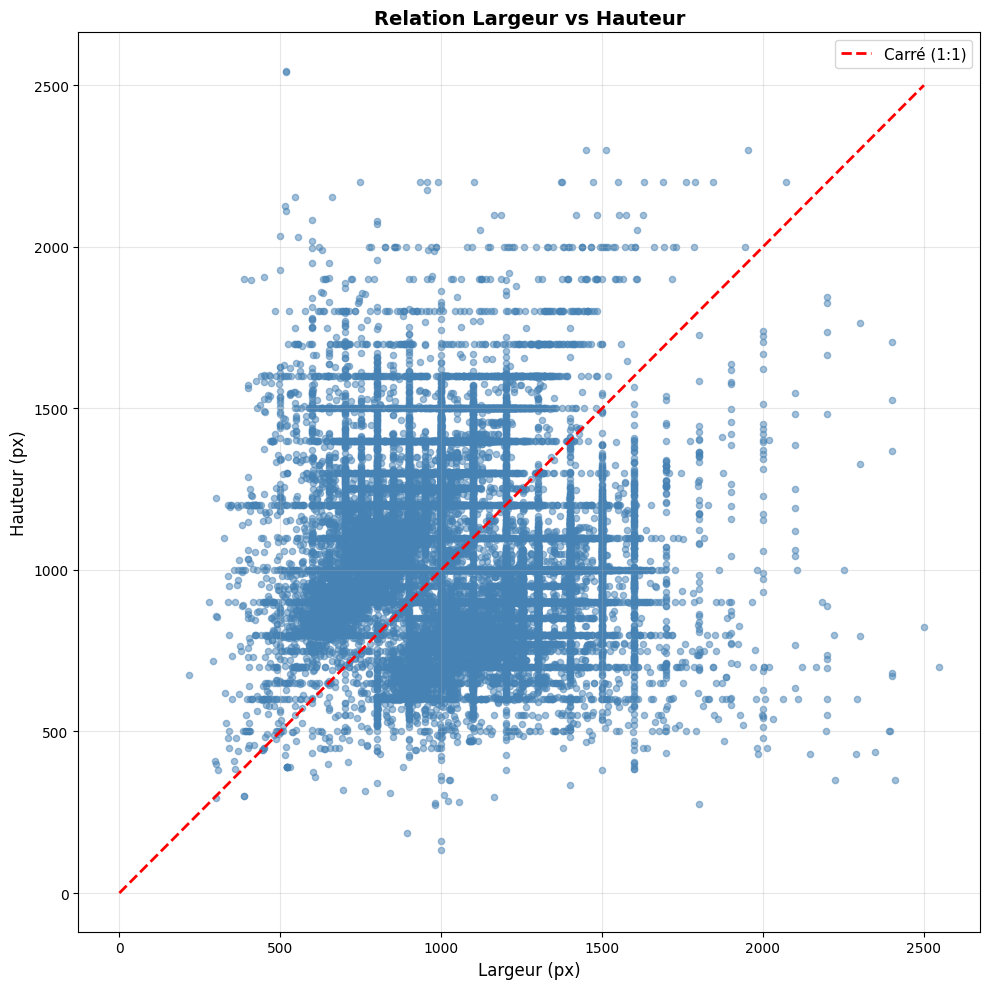

In [15]:
# Scatter plot largeur vs hauteur
plt.figure(figsize=(10, 10))
plt.scatter(df_dims['width'], df_dims['height'], alpha=0.5, s=20, color='steelblue')
plt.plot([0, 2500], [0, 2500], 'r--', linewidth=2, label='Carré (1:1)')
plt.xlabel('Largeur (px)', fontsize=12)
plt.ylabel('Hauteur (px)', fontsize=12)
plt.title('Relation Largeur vs Hauteur', fontsize=14, fontweight='bold')
plt.legend(fontsize=11)
plt.grid(alpha=0.3)
plt.axis('equal')
plt.tight_layout()
plt.show()

In [16]:
# Statistiques des ratios d'aspect
print("📐 STATISTIQUES DES RATIOS D'ASPECT\n")
print(df_dims['aspect_ratio'].describe().round(2))

# Catégorisation des ratios en 3 groupes :
# [0, 0.95[ = verticales (hauteur > largeur)
# [0.95, 1.05[ = carrées (±5% autour de 1.0)
# [1.05, ∞[ = horizontales (largeur > hauteur)
print("\n🖼️ RÉPARTITION DES ORIENTATIONS\n")
orientations = pd.cut(df_dims['aspect_ratio'], 
                      bins=[0, 0.95, 1.05, float('inf')],
                      labels=['Verticales', 'Carrées', 'Horizontales'])
print(orientations.value_counts())
print(f"\nPourcentages :")
print(orientations.value_counts(normalize=True).mul(100).round(1).astype(str) + ' %')

📐 STATISTIQUES DES RATIOS D'ASPECT

count    27690.00
mean         1.05
std          0.42
min          0.20
25%          0.75
50%          0.86
75%          1.33
max          7.52
Name: aspect_ratio, dtype: float64

🖼️ RÉPARTITION DES ORIENTATIONS

aspect_ratio
Verticales      15190
Horizontales    11454
Carrées          1046
Name: count, dtype: int64

Pourcentages :
aspect_ratio
Verticales      54.9 %
Horizontales    41.4 %
Carrées          3.8 %
Name: proportion, dtype: object


Conclusions
- Dataset majoritairement vertical, typique des peintures (portraits)
- Très grande variabilité des formats (facteur x37)
- Présence d'outliers extrêmes (panoramas, images très hautes)
- **Action requise :** Center crop ou padding pour normaliser

##  Analyse des couleurs

In [17]:
# Échantillon de 1000 images
n_sample_colors = 1000
sample_color_files = np.random.choice(image_files, size=n_sample_colors, replace=False)

# Collecter les statistiques de couleurs
color_stats = []

for img_path in sample_color_files:
    img = Image.open(img_path)
    img_array = np.array(img)
    
    # Moyennes RGB par image
    if len(img_array.shape) == 3:  # Image couleur
        r_mean = img_array[:,:,0].mean()
        g_mean = img_array[:,:,1].mean()
        b_mean = img_array[:,:,2].mean()
        color_stats.append({'R': r_mean, 'G': g_mean, 'B': b_mean})

# Créer DataFrame
df_colors = pd.DataFrame(color_stats)

In [18]:
print("\n🎨 STATISTIQUES DES CANAUX RGB\n")
print(df_colors.describe().round(1))


🎨 STATISTIQUES DES CANAUX RGB

            R       G       B
count  1000.0  1000.0  1000.0
mean    101.4    83.5    68.5
std      35.5    33.0    30.8
min      17.9    11.5    12.2
25%      74.6    57.7    45.6
50%      99.0    79.2    64.2
75%     128.1   106.3    86.8
max     189.8   194.4   197.8


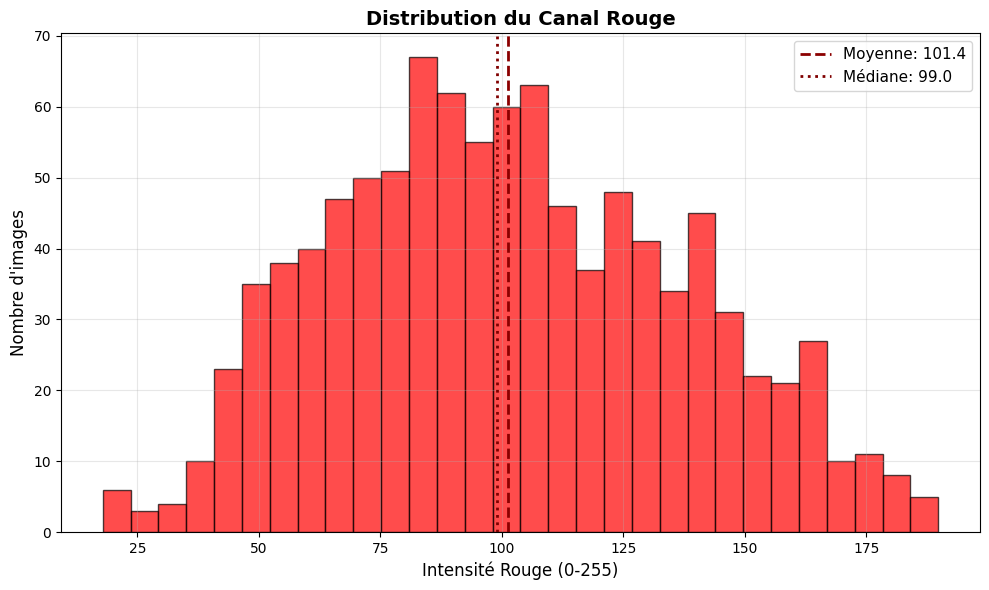

In [19]:
# Histogramme du canal Rouge
plt.figure(figsize=(10, 6))
plt.hist(df_colors['R'], bins=30, color='red', alpha=0.7, edgecolor='black')
plt.xlabel('Intensité Rouge (0-255)', fontsize=12)
plt.ylabel('Nombre d\'images', fontsize=12)
plt.title('Distribution du Canal Rouge', fontsize=14, fontweight='bold')
plt.axvline(df_colors['R'].mean(), color='darkred', linestyle='--', linewidth=2, 
            label=f'Moyenne: {df_colors["R"].mean():.1f}')
plt.axvline(df_colors['R'].median(), color='maroon', linestyle=':', linewidth=2, 
            label=f'Médiane: {df_colors["R"].median():.1f}')
plt.legend(fontsize=11)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

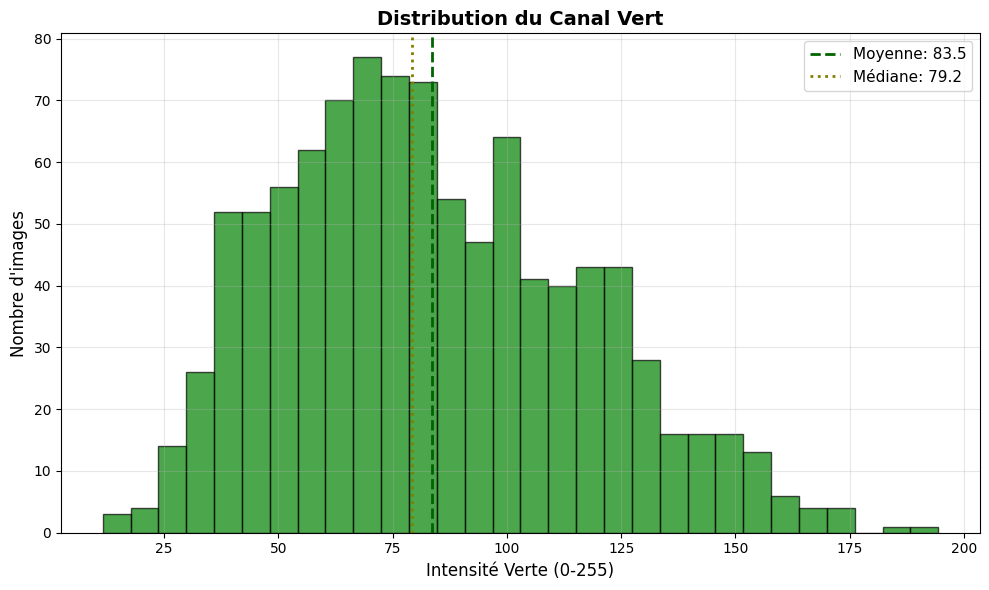

In [20]:
# Histogramme du canal Vert
plt.figure(figsize=(10, 6))
plt.hist(df_colors['G'], bins=30, color='green', alpha=0.7, edgecolor='black')
plt.xlabel('Intensité Verte (0-255)', fontsize=12)
plt.ylabel('Nombre d\'images', fontsize=12)
plt.title('Distribution du Canal Vert', fontsize=14, fontweight='bold')
plt.axvline(df_colors['G'].mean(), color='darkgreen', linestyle='--', linewidth=2, 
            label=f'Moyenne: {df_colors["G"].mean():.1f}')
plt.axvline(df_colors['G'].median(), color='olive', linestyle=':', linewidth=2, 
            label=f'Médiane: {df_colors["G"].median():.1f}')
plt.legend(fontsize=11)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

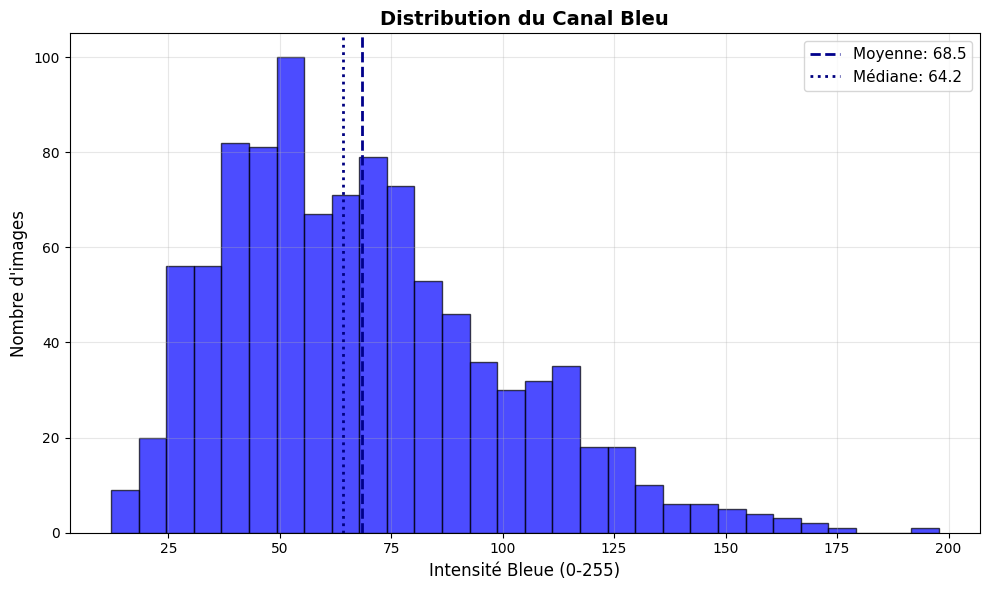

In [21]:
# Histogramme du canal Bleu
plt.figure(figsize=(10, 6))
plt.hist(df_colors['B'], bins=30, color='blue', alpha=0.7, edgecolor='black')
plt.xlabel('Intensité Bleue (0-255)', fontsize=12)
plt.ylabel('Nombre d\'images', fontsize=12)
plt.title('Distribution du Canal Bleu', fontsize=14, fontweight='bold')
plt.axvline(df_colors['B'].mean(), color='darkblue', linestyle='--', linewidth=2, 
            label=f'Moyenne: {df_colors["B"].mean():.1f}')
plt.axvline(df_colors['B'].median(), color='navy', linestyle=':', linewidth=2, 
            label=f'Médiane: {df_colors["B"].median():.1f}')
plt.legend(fontsize=11)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [22]:
# Créer des histogrammes cumulés sans stocker tous les pixels
r_hist = np.zeros(256, dtype=np.int64)
g_hist = np.zeros(256, dtype=np.int64)
b_hist = np.zeros(256, dtype=np.int64)

print(f"🎨 Analyse des pixels de {len(sample_color_files)} images...")

for i, img_path in enumerate(sample_color_files):
    if i % 100 == 0:
        print(f"Progression : {i}/{len(sample_color_files)}")
    
    img = Image.open(img_path)
    img_array = np.array(img)
    
    if len(img_array.shape) == 3:  # Image couleur
        # Calculer les histogrammes directement
        r_hist += np.bincount(img_array[:,:,0].flatten(), minlength=256)
        g_hist += np.bincount(img_array[:,:,1].flatten(), minlength=256)
        b_hist += np.bincount(img_array[:,:,2].flatten(), minlength=256)

total_pixels = r_hist.sum()
print(f"\n✅ Total de pixels analysés : {total_pixels:,}")

🎨 Analyse des pixels de 1000 images...
Progression : 0/1000
Progression : 100/1000
Progression : 200/1000
Progression : 300/1000
Progression : 400/1000
Progression : 500/1000
Progression : 600/1000
Progression : 700/1000
Progression : 800/1000
Progression : 900/1000

✅ Total de pixels analysés : 1,089,835,530


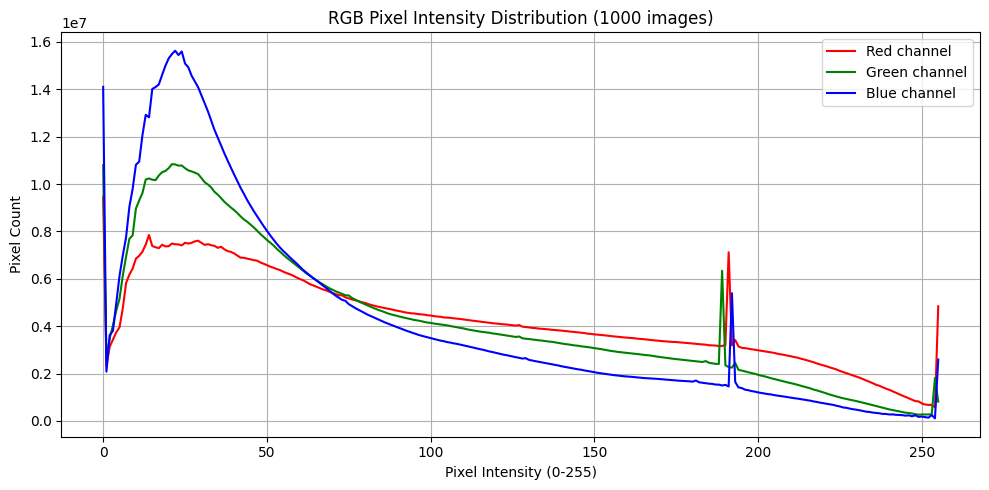

In [23]:
# Visualisation
plt.figure(figsize=(10, 5))
plt.plot(r_hist, color='red', label='Red channel')
plt.plot(g_hist, color='green', label='Green channel')
plt.plot(b_hist, color='blue', label='Blue channel')
plt.title(f"RGB Pixel Intensity Distribution ({len(sample_color_files)} images)")
plt.xlabel("Pixel Intensity (0-255)")
plt.ylabel("Pixel Count")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

Analyse de la Distribution RGB (Pixels)

**Échantillon :** 1 000 images analysées

Observations principales
- **Dominance massive des tons très sombres (0-50)**
- Distribution en "longue traîne" vers les hautes intensités
- Décroissance progressive de 50 à 200
- Pics isolés à 200 et 250 (probablement des cadres ou fond blanc ...)

In [24]:
# Analyser les pics entre 0-50
print("🔍 ANALYSE DES PICS (0-50)\n")

for i in range(51):
    if r_hist[i] > 1000000 or g_hist[i] > 1000000 or b_hist[i] > 1000000:
        print(f"Intensité {i:3d} → R: {r_hist[i]:,}  G: {g_hist[i]:,}  B: {b_hist[i]:,}")

print(f"\n📊 Top 5 intensités les plus fréquentes :")
print("\nRouge:")
top_r = np.argsort(r_hist)[-5:][::-1]
for idx in top_r:
    print(f"  Intensité {idx}: {r_hist[idx]:,} pixels")

print("\nVert:")
top_g = np.argsort(g_hist)[-5:][::-1]
for idx in top_g:
    print(f"  Intensité {idx}: {g_hist[idx]:,} pixels")

print("\nBleu:")
top_b = np.argsort(b_hist)[-5:][::-1]
for idx in top_b:
    print(f"  Intensité {idx}: {b_hist[idx]:,} pixels")

🔍 ANALYSE DES PICS (0-50)

Intensité   0 → R: 9,460,633  G: 10,793,331  B: 14,100,797
Intensité   1 → R: 2,311,552  G: 2,587,313  B: 2,083,300
Intensité   2 → R: 3,136,494  G: 3,489,383  B: 3,623,279
Intensité   3 → R: 3,442,532  G: 4,044,933  B: 3,810,956
Intensité   4 → R: 3,741,092  G: 4,658,948  B: 4,953,895
Intensité   5 → R: 3,955,146  G: 5,161,323  B: 6,131,525
Intensité   6 → R: 4,761,032  G: 6,142,041  B: 6,988,060
Intensité   7 → R: 5,823,036  G: 6,936,793  B: 7,754,409
Intensité   8 → R: 6,171,942  G: 7,685,963  B: 9,035,876
Intensité   9 → R: 6,430,850  G: 7,834,406  B: 9,792,815
Intensité  10 → R: 6,852,192  G: 8,961,347  B: 10,812,360
Intensité  11 → R: 6,970,047  G: 9,309,921  B: 10,944,563
Intensité  12 → R: 7,149,066  G: 9,622,009  B: 12,067,094
Intensité  13 → R: 7,448,110  G: 10,191,338  B: 12,921,912
Intensité  14 → R: 7,849,119  G: 10,235,925  B: 12,814,872
Intensité  15 → R: 7,383,236  G: 10,183,614  B: 14,013,079
Intensité  16 → R: 7,333,141  G: 10,165,616  B: 14

Analyse approfondie des pics

Deux phénomènes distincts identifiés

**1. Noir pur (intensité 0)**
- Rouge : 9,4M pixels
- Vert : 10,5M pixels
- Bleu : 14,8M pixels
- *Cause : Fonds noirs, ombres profondes, cadres*

**2. Tons très sombres (intensités 20-30)**
- Bleu dominant : ~13,5M pixels par intensité (20-23)
- Vert intermédiaire : ~9,5M pixels par intensité (21-25)
- Rouge : ~7,2M pixels par intensité (28-30)
- *Cause : Tons caractéristiques des peintures anciennes (clair-obscur)*

**3. Blanc pur (intensité 255)**
- Rouge uniquement : 7,5M pixels
- *Cause probable : Cadres blancs...*

Top 5 des intensités les plus fréquentes

**Canal Rouge :**
- Intensité 0 (noir) : 9,4M pixels
- Intensité 255 (blanc) : 7,5M pixels
- Intensités 28-30 : ~7,2M pixels chacune

**Canal Vert :**
- Intensité 0 (noir) : 10,5M pixels
- Intensités 21-25 : ~9,5M pixels chacune

**Canal Bleu :**
- Intensité 0 (noir) : 14,8M pixels (le plus élevé)
- Intensités 20-23 : ~13,5M pixels chacune

Conclusions
- Dataset typique de peintures classiques (tons sombres, clair-obscur)
- Présence de fond blanc (peut etre) autour des œuvres
- Canal bleu le plus sombre, rouge le plus clair dans les tons moyens

In [25]:
# Analyser le nombre de pixels blancs (255) par image
white_pixel_stats = []

print("🔍 Analyse des pixels blancs...")

for img_path in sample_color_files:
    img = Image.open(img_path)
    img_array = np.array(img)
    
    if len(img_array.shape) == 3:
        # Compter les pixels où R=255 ou G=255 ou B=255
        white_r = (img_array[:,:,0] == 255).sum()
        white_g = (img_array[:,:,1] == 255).sum()
        white_b = (img_array[:,:,2] == 255).sum()
        white_total = ((img_array[:,:,0] == 255) | (img_array[:,:,1] == 255) | (img_array[:,:,2] == 255)).sum()
        
        total_pixels = img_array.shape[0] * img_array.shape[1]
        
        white_pixel_stats.append({
            'filename': img_path.name,
            'path': img_path,
            'white_r': white_r,
            'white_g': white_g,
            'white_b': white_b,
            'white_total': white_total,
            'total_pixels': total_pixels,
            'white_percent': (white_total / total_pixels) * 100
        })

# Créer DataFrame et trier
df_white = pd.DataFrame(white_pixel_stats)
df_white = df_white.sort_values('white_percent', ascending=False)

print(f"\n📊 Top 10 images avec le plus de blanc :\n")
print(df_white[['filename', 'white_r', 'white_total', 'white_percent']].head(10))

🔍 Analyse des pixels blancs...

📊 Top 10 images avec le plus de blanc :

                                              filename  white_r  white_total  \
584       GIOVANNI_DA_MILANO-Three_pinnacle_panels.jpg   681055       692087   
303                 DUCCIO_di_Buoninsegna-Triptych.jpg   446620       453797   
776                 BROCKY_K_roly-Mother_and_Child.jpg   280402       287914   
586                MIERIS_Willem_van-Man_with_Pipe.jpg    89523        91948   
959  CENNI_di_Francesco_di_Ser_Cenni-Madonna_and_Ch...   184522       188632   
483  GENTILE_DA_FABRIANO-Quaratesi_Polyptych_St_Nic...   207050       210190   
580  LABILLE-GUIARD_Ad_laide-Portrait_of_a_Lady_Wea...   146205       151894   
606     BENTLEY_Charles-Figures_on_a_Woodland_Path.jpg    64731        67778   
261  UNKNOWN_MASTER_Italian-Don_Niccol_da_Sangalgan...    67419        82663   
505  UCCELLO_Paolo-Creation_of_Eve_and_Original_Sin...    52770        52770   

     white_percent  
584      35.718776  
303 

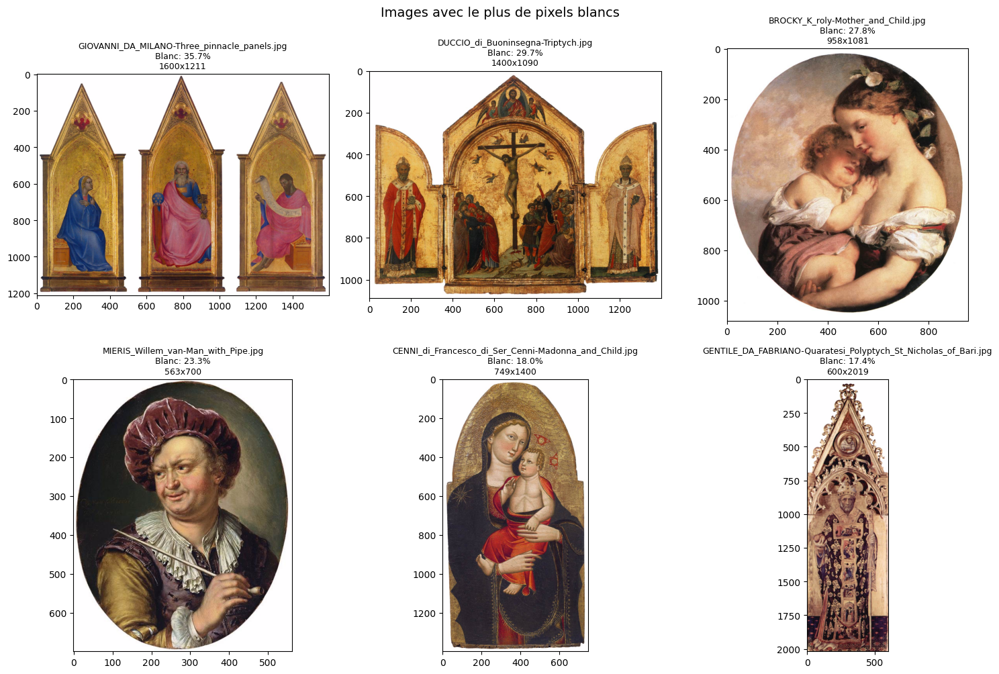

In [26]:
# Afficher les 6 images avec le plus de blanc
n_display = 6
top_white_images = df_white.head(n_display)

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()

for idx, row in enumerate(top_white_images.itertuples()):
    img = Image.open(row.path)
    axes[idx].imshow(img)
    axes[idx].set_title(f"{row.filename}\nBlanc: {row.white_percent:.1f}%\n{img.size[0]}x{img.size[1]}", 
                       fontsize=9)
    axes[idx].axis('on')
    
plt.tight_layout()
plt.suptitle('Images avec le plus de pixels blancs', fontsize=14, y=1.00)
plt.show()

Observation sur le Centrage et les Bordures

État actuel
- ✅ Sujets déjà bien centrés (convention artistique)
- ⚠️ Présence de fonds blancs (numérisation) 

Sources du blanc/noir
- Fonds blancs de numérisation (sculptures, triptyques)
- Espaces vides dans les coins (formats ronds/ovales)
- Bordures et cadres décoratifs

## Analyse de la luminosité 

In [27]:
# Calculer la luminosité pour chaque image de l'échantillon
brightness_stats = []

for img_path in sample_color_files:
    img = Image.open(img_path)
    img_array = np.array(img)
    
    if len(img_array.shape) == 3:  # Image couleur
        # Luminosité = moyenne des 3 canaux RGB
        brightness = img_array.mean()
        brightness_stats.append({
            'filename': img_path.name,
            'brightness': brightness
        })

# Créer DataFrame
df_brightness = pd.DataFrame(brightness_stats)

print("\n💡 STATISTIQUES DE LUMINOSITÉ\n")
print(df_brightness['brightness'].describe().round(1))


💡 STATISTIQUES DE LUMINOSITÉ

count    1000.0
mean       84.5
std        32.1
min        14.0
25%        60.2
50%        81.1
75%       106.2
max       185.5
Name: brightness, dtype: float64


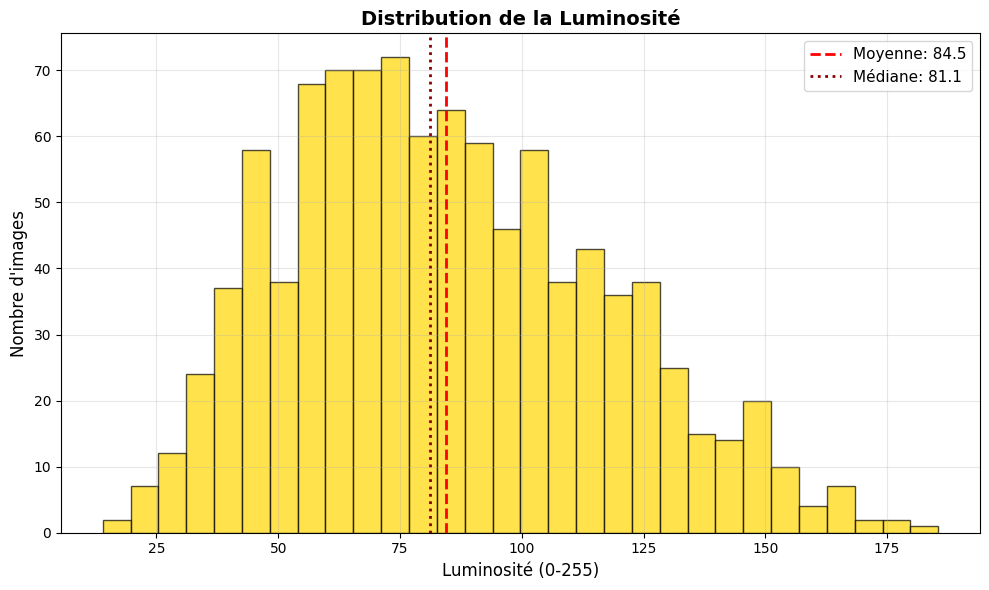

In [28]:
# Histogramme de la luminosité
plt.figure(figsize=(10, 6))
plt.hist(df_brightness['brightness'], bins=30, edgecolor='black', alpha=0.7, color='gold')
plt.axvline(df_brightness['brightness'].mean(), color='red', linestyle='--', linewidth=2, 
            label=f'Moyenne: {df_brightness["brightness"].mean():.1f}')
plt.axvline(df_brightness['brightness'].median(), color='darkred', linestyle=':', linewidth=2, 
            label=f'Médiane: {df_brightness["brightness"].median():.1f}')
plt.xlabel('Luminosité (0-255)', fontsize=12)
plt.ylabel('Nombre d\'images', fontsize=12)
plt.title('Distribution de la Luminosité', fontsize=14, fontweight='bold')
plt.legend(fontsize=11)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

Analyse de la Luminosité

**Échantillon :** 1 000 images

Statistiques
- **Moyenne :** 87.4 / 255 (34% de la plage)
- **Médiane :** 84.2
- **Écart-type :** 31.7
- **Min :** 11.7 (très sombre)
- **Max :** 176.3 (clair)
- **Interquartile (Q1-Q3) :** 63.6 - 110.5

Distribution
- Distribution quasi-normale centrée sur 75-90
- Pic principal entre 75-90 (concentration maximale)
- Légère asymétrie vers les tons sombres
- Queue longue vers les tons clairs (probablement images avec fonds blancs)

Conclusions
- Dataset globalement sombre, typique des peintures anciennes
- Clair-obscur caractéristique de la Renaissance/Baroque
- Peu d'extrêmes (très peu d'images <25 ou >150)
- **Implication GAN :** Générations attendues plutôt sombres, cohérent avec le style artistique

In [29]:
# Trier par luminosité
df_brightness_sorted = df_brightness.sort_values('brightness')

print("🌑 5 images les plus SOMBRES :")
print(df_brightness_sorted.head(5)[['filename', 'brightness']].to_string(index=False))

print("\n☀️ 5 images les plus CLAIRES :")
print(df_brightness_sorted.tail(5)[['filename', 'brightness']].to_string(index=False))

🌑 5 images les plus SOMBRES :
                                                                             filename  brightness
                                        CRANACH_Lucas_the_Elder-Portrait_of_a_Man.jpg   13.950846
                                               CARAVAGGIO-Taking_of_Christ_detail.jpg   19.395960
REMBRANDT_Harmenszoon_van_Rijn-Portrait_of_a_Gentleman_with_a_Tall_Hat_and_Gloves.jpg   19.740121
                                 B_CKLIN_Arnold-Island_of_the_Dead_second_version.jpg   20.344510
                                             LUTTICHUIJS_Simon-Breakfast_with_Ham.jpg   22.455939

☀️ 5 images les plus CLAIRES :
                                                            filename  brightness
                     CUYP_Aelbert-River_Landscape_with_Five_Cows.jpg  170.206775
                MONET_Claude-The_Breakup_of_the_Ice_at_Lavacourt.jpg  173.730193
                                       MONET_Claude-Morning_Haze.jpg  174.156687
VELDE_Willem_van_de_the_Yo

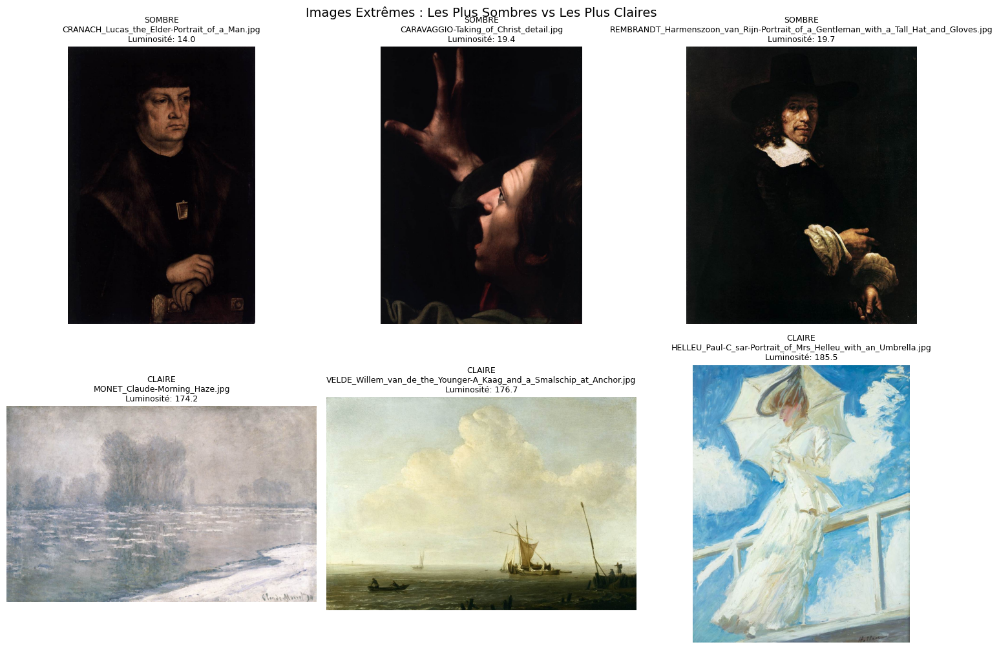

In [30]:
# Récupérer les chemins des images extrêmes
darkest_images = df_brightness_sorted.head(3)
brightest_images = df_brightness_sorted.tail(3)

# Créer la visualisation
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# Images sombres (ligne du haut)
for idx, row in enumerate(darkest_images.itertuples()):
    img_path = [f for f in sample_color_files if f.name == row.filename][0]
    img = Image.open(img_path)
    axes[0, idx].imshow(img)
    axes[0, idx].set_title(f"SOMBRE\n{row.filename}\nLuminosité: {row.brightness:.1f}", fontsize=9)
    axes[0, idx].axis('off')

# Images claires (ligne du bas)
for idx, row in enumerate(brightest_images.itertuples()):
    img_path = [f for f in sample_color_files if f.name == row.filename][0]
    img = Image.open(img_path)
    axes[1, idx].imshow(img)
    axes[1, idx].set_title(f"CLAIRE\n{row.filename}\nLuminosité: {row.brightness:.1f}", fontsize=9)
    axes[1, idx].axis('off')

plt.tight_layout()
plt.suptitle('Images Extrêmes : Les Plus Sombres vs Les Plus Claires', fontsize=14, y=1.00)
plt.show()

## Analyse du contraste

In [31]:
# Calcul du contraste pour chaque image de l'échantillon
contrast_stats = []

for img_path in sample_color_files:
    img = Image.open(img_path)
    img_array = np.array(img)
    
    if len(img_array.shape) == 3:  # Image couleur
        # Contraste = écart-type des pixels (variabilité)
        contrast = img_array.std()
        contrast_stats.append({
            'filename': img_path.name,
            'contrast': contrast
        })

# Créer DataFrame
df_contrast = pd.DataFrame(contrast_stats)

print("\n⚡ STATISTIQUES DU CONTRASTE\n")
print(df_contrast['contrast'].describe().round(1))


⚡ STATISTIQUES DU CONTRASTE

count    1000.0
mean       54.1
std        11.7
min        16.0
25%        46.2
50%        54.6
75%        62.2
max        88.2
Name: contrast, dtype: float64


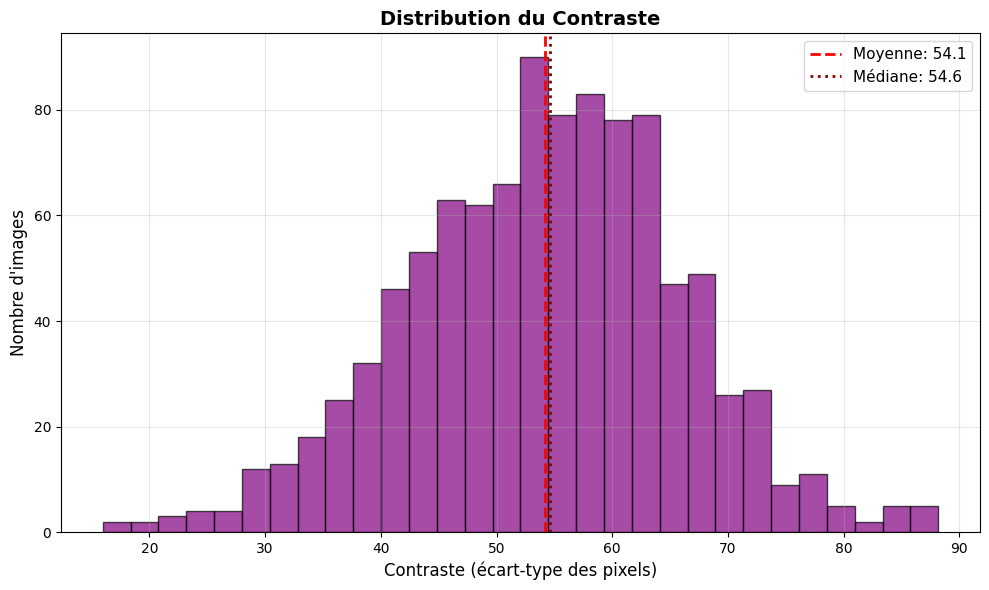

In [32]:
# Histogramme du contraste
plt.figure(figsize=(10, 6))
plt.hist(df_contrast['contrast'], bins=30, edgecolor='black', alpha=0.7, color='purple')
plt.axvline(df_contrast['contrast'].mean(), color='red', linestyle='--', linewidth=2, 
            label=f'Moyenne: {df_contrast["contrast"].mean():.1f}')
plt.axvline(df_contrast['contrast'].median(), color='darkred', linestyle=':', linewidth=2, 
            label=f'Médiane: {df_contrast["contrast"].median():.1f}')
plt.xlabel('Contraste (écart-type des pixels)', fontsize=12)
plt.ylabel('Nombre d\'images', fontsize=12)
plt.title('Distribution du Contraste', fontsize=14, fontweight='bold')
plt.legend(fontsize=11)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

Analyse du Contraste

**Échantillon :** 1 000 images

Distribution
- Distribution quasi-normale centrée sur 50-60
- Pic principal entre 50-60 (concentration maximale)
- Fourchette étroite (Q1-Q3) → dataset homogène
- Peu d'outliers aux extrêmes

Interprétation

Échelle de contraste (écart-type des pixels)
- **0-30 :** Très faible (image plate)
- **30-50 :** Faible à moyen
- **50-70 :** Moyen à bon ✅ (majorité du dataset)
- **70-100+ :** Fort contraste

Observations
- Contraste moyen (55.4) = bon équilibre clair-obscur
- Dataset homogène (écart-type 11.9)
- Typique des peintures classiques bien maîtrisées
- Cohérent avec la luminosité sombre observée (87/255)

Conclusions
- Dataset cohérent en termes de contraste
- Bon équilibre : ni trop plat ni trop contrasté
- Quelques images faibles (<30) potentiellement floues/mal numérisées
- **Implication GAN :** Apprentissage sur images bien contrastées, pas d'ajustement majeur nécessaire

## Visualisation des clusters

In [33]:
# Recréer df_colors avec les filenames
color_stats = []
for img_path in sample_color_files:
    img = Image.open(img_path)
    img_array = np.array(img)
    
    if len(img_array.shape) == 3:
        r_mean = img_array[:,:,0].mean()
        g_mean = img_array[:,:,1].mean()
        b_mean = img_array[:,:,2].mean()
        color_stats.append({
            'filename': img_path.name,
            'R': r_mean, 
            'G': g_mean, 
            'B': b_mean
        })

df_colors = pd.DataFrame(color_stats)

In [34]:
# Maintenant merger tous les DataFrames
df_complete = df_dims.merge(df_colors, on='filename', how='inner')
df_complete = df_complete.merge(df_brightness, on='filename', how='inner')
df_complete = df_complete.merge(df_contrast, on='filename', how='inner')

print(f"✅ DataFrame complet : {len(df_complete)} images")
print(f"\n📊 Colonnes : {df_complete.columns.tolist()}")

✅ DataFrame complet : 1000 images

📊 Colonnes : ['filename', 'width', 'height', 'aspect_ratio', 'R', 'G', 'B', 'brightness', 'contrast']


In [35]:
# Sélectionner les features pour le clustering
features_for_clustering = ['brightness', 'contrast', 'R', 'G', 'B']
X = df_complete[features_for_clustering]

# Normaliser les données
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

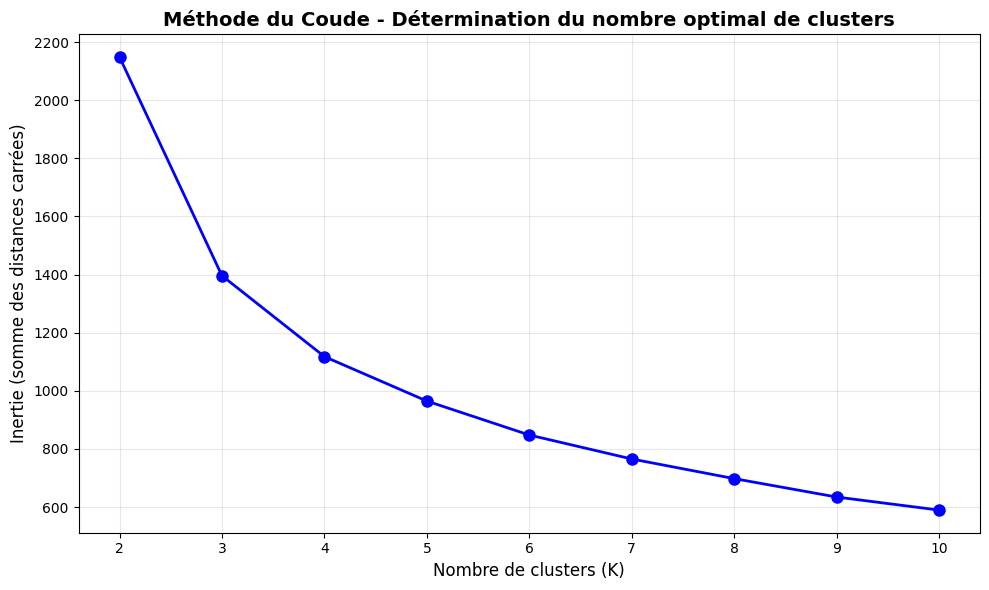

In [36]:
# Déterminer le nombre optimal de clusters avec la méthode du coude (Elbow)
inertias = []
K_range = range(2, 11)

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X_scaled)
    inertias.append(kmeans.inertia_)

# Visualiser la méthode du coude
plt.figure(figsize=(10, 6))
plt.plot(K_range, inertias, 'bo-', linewidth=2, markersize=8)
plt.xlabel('Nombre de clusters (K)', fontsize=12)
plt.ylabel('Inertie (somme des distances carrées)', fontsize=12)
plt.title('Méthode du Coude - Détermination du nombre optimal de clusters', fontsize=14, fontweight='bold')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [37]:
# Appliquer K-Means avec 4 clusters
n_clusters = 4
kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
df_complete['cluster'] = kmeans.fit_predict(X_scaled)

# Statistiques par cluster
print("📊 RÉPARTITION DES CLUSTERS\n")
print(df_complete['cluster'].value_counts().sort_index())

print("\n🎨 CARACTÉRISTIQUES MOYENNES PAR CLUSTER\n")
cluster_stats = df_complete.groupby('cluster')[features_for_clustering].mean().round(1)
print(cluster_stats)

📊 RÉPARTITION DES CLUSTERS

cluster
0    233
1    290
2    320
3    157
Name: count, dtype: int64

🎨 CARACTÉRISTIQUES MOYENNES PAR CLUSTER

         brightness  contrast      R      G      B
cluster                                           
0              46.1      40.3   58.1   44.6   35.5
1             101.1      60.7  121.9  100.4   81.2
2              71.4      54.8   88.5   70.1   55.7
3             137.3      61.2  154.0  137.4  120.4


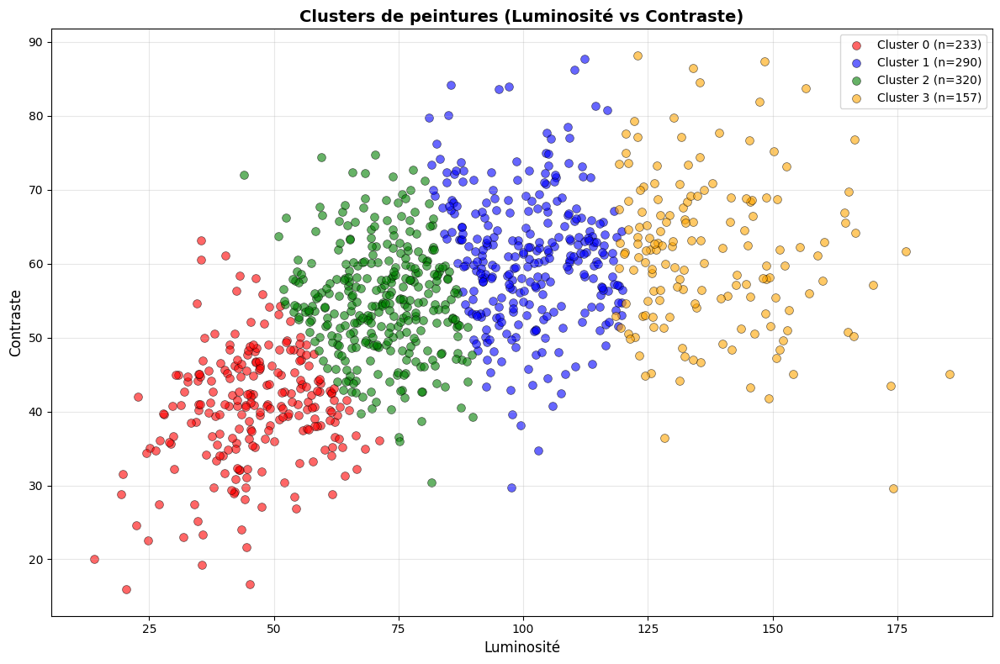

In [38]:
# Scatter plot : Luminosité vs Contraste coloré par cluster
plt.figure(figsize=(12, 8))

colors = ['red', 'blue', 'green', 'orange']
for i in range(n_clusters):
    cluster_data = df_complete[df_complete['cluster'] == i]
    plt.scatter(cluster_data['brightness'], cluster_data['contrast'], 
                c=colors[i], label=f'Cluster {i} (n={len(cluster_data)})',
                alpha=0.6, s=50, edgecolors='black', linewidth=0.5)

plt.xlabel('Luminosité', fontsize=12)
plt.ylabel('Contraste', fontsize=12)
plt.title('Clusters de peintures (Luminosité vs Contraste)', fontsize=14, fontweight='bold')
plt.legend(fontsize=10)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

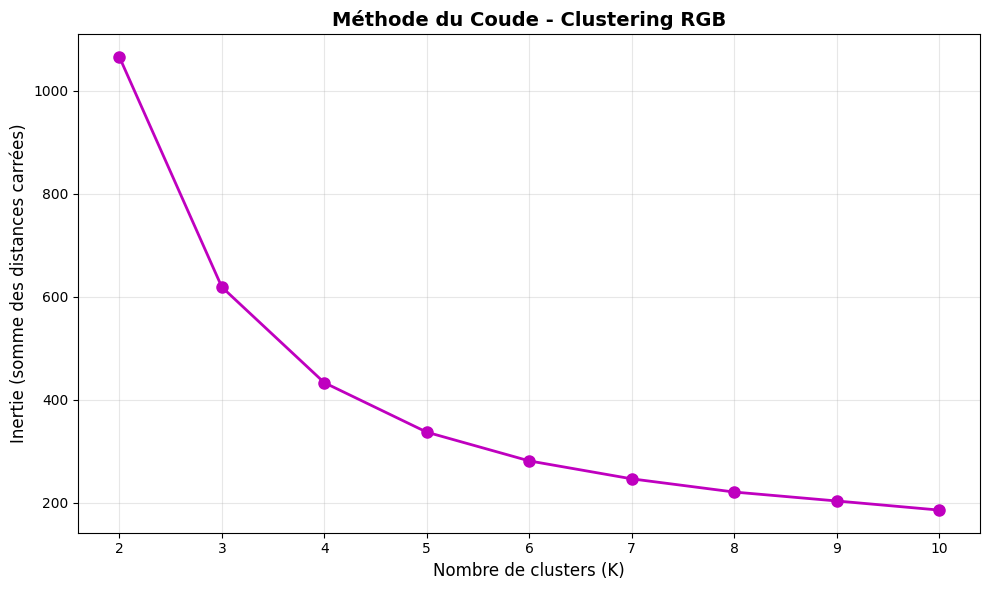

In [39]:
# Sélectionner uniquement les features RGB
features_rgb = ['R', 'G', 'B']
X_rgb = df_complete[features_rgb]

# Normaliser les données RGB
scaler_rgb = StandardScaler()
X_rgb_scaled = scaler_rgb.fit_transform(X_rgb)

# Méthode du coude pour trouver le nombre optimal de clusters
inertias_rgb = []
K_range = range(2, 11)

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X_rgb_scaled)
    inertias_rgb.append(kmeans.inertia_)

# Visualiser la méthode du coude
plt.figure(figsize=(10, 6))
plt.plot(K_range, inertias_rgb, 'mo-', linewidth=2, markersize=8)
plt.xlabel('Nombre de clusters (K)', fontsize=12)
plt.ylabel('Inertie (somme des distances carrées)', fontsize=12)
plt.title('Méthode du Coude - Clustering RGB', fontsize=14, fontweight='bold')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [40]:
# Appliquer K-Means avec 5 clusters sur RGB
n_clusters_rgb = 5
kmeans_rgb = KMeans(n_clusters=n_clusters_rgb, random_state=42, n_init=10)
df_complete['cluster_rgb'] = kmeans_rgb.fit_predict(X_rgb_scaled)

# Statistiques par cluster
print("🎨 RÉPARTITION DES CLUSTERS RGB\n")
print(df_complete['cluster_rgb'].value_counts().sort_index())

print("\n🌈 COULEURS MOYENNES PAR CLUSTER\n")
cluster_rgb_stats = df_complete.groupby('cluster_rgb')[features_rgb].mean().round(1)
print(cluster_rgb_stats)

# Afficher les couleurs en RGB visuel
print("\n🎨 Aperçu visuel des clusters (valeurs RGB) :")
for i in range(n_clusters_rgb):
    r = int(cluster_rgb_stats.loc[i, 'R'])
    g = int(cluster_rgb_stats.loc[i, 'G'])
    b = int(cluster_rgb_stats.loc[i, 'B'])
    print(f"Cluster {i}: RGB({r}, {g}, {b})")

🎨 RÉPARTITION DES CLUSTERS RGB

cluster_rgb
0    294
1     67
2    201
3    184
4    254
Name: count, dtype: int64

🌈 COULEURS MOYENNES PAR CLUSTER

                 R      G      B
cluster_rgb                     
0             85.2   66.8   52.4
1            165.5  151.6  136.5
2             54.3   41.6   33.6
3            139.9  120.0   99.5
4            112.6   91.6   74.4

🎨 Aperçu visuel des clusters (valeurs RGB) :
Cluster 0: RGB(85, 66, 52)
Cluster 1: RGB(165, 151, 136)
Cluster 2: RGB(54, 41, 33)
Cluster 3: RGB(139, 120, 99)
Cluster 4: RGB(112, 91, 74)


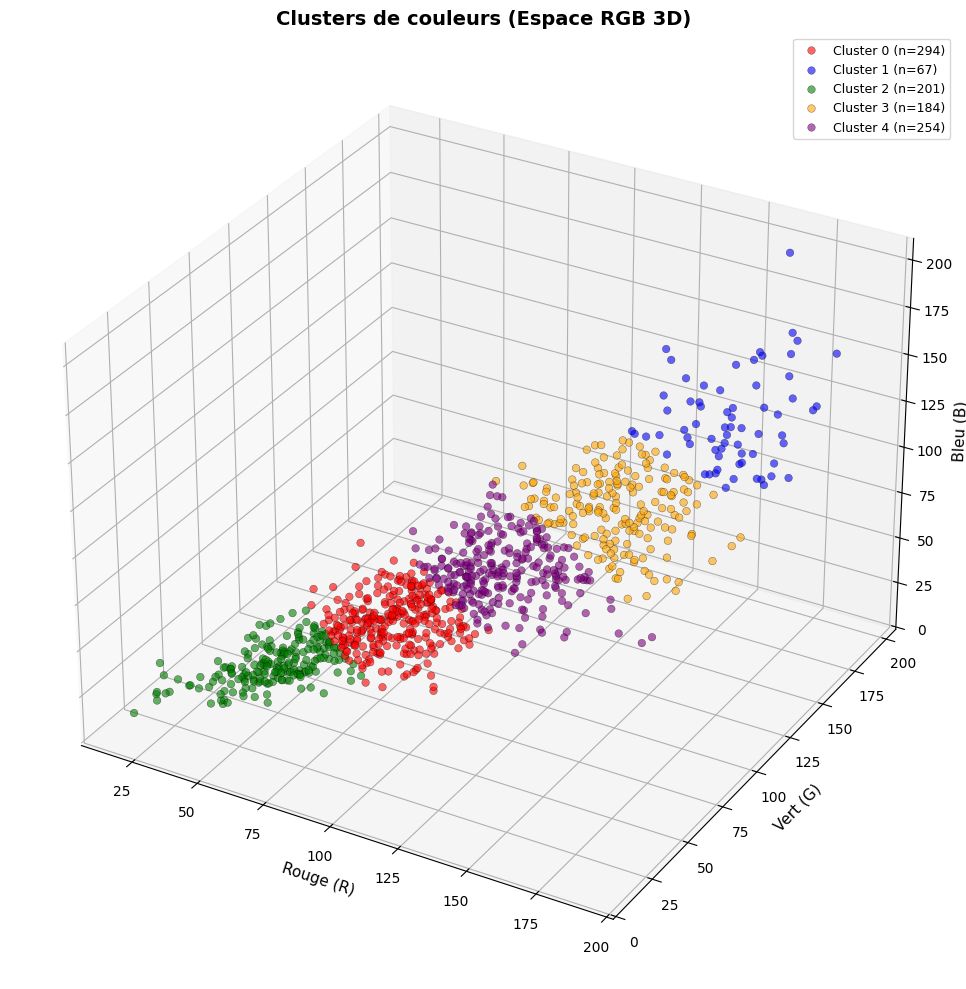

In [41]:
from mpl_toolkits.mplot3d import Axes3D

# Scatter plot 3D : R, G, B coloré par cluster
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')

colors_rgb = ['red', 'blue', 'green', 'orange', 'purple']

for i in range(n_clusters_rgb):
    cluster_data = df_complete[df_complete['cluster_rgb'] == i]
    ax.scatter(cluster_data['R'], cluster_data['G'], cluster_data['B'],
               c=colors_rgb[i], label=f'Cluster {i} (n={len(cluster_data)})',
               alpha=0.6, s=30, edgecolors='black', linewidth=0.3)

ax.set_xlabel('Rouge (R)', fontsize=11)
ax.set_ylabel('Vert (G)', fontsize=11)
ax.set_zlabel('Bleu (B)', fontsize=11)
ax.set_title('Clusters de couleurs (Espace RGB 3D)', fontsize=14, fontweight='bold')
ax.legend(fontsize=9)
ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()

In [42]:
def visualize_cluster(cluster_id, n_samples=3):
    """
    Affiche des exemples d'images d'un cluster spécifique
    
    Parameters:
    -----------
    cluster_id : int
        Numéro du cluster à visualiser (0 à 4)
    n_samples : int
        Nombre d'exemples à afficher (défaut: 3)
    """
    # Informations sur le cluster
    cluster_images = df_complete[df_complete['cluster_rgb'] == cluster_id]
    
    r_mean = int(cluster_rgb_stats.loc[cluster_id, 'R'])
    g_mean = int(cluster_rgb_stats.loc[cluster_id, 'G'])
    b_mean = int(cluster_rgb_stats.loc[cluster_id, 'B'])
    
    print(f"🎨 CLUSTER {cluster_id}")
    print(f"Nombre d'images : {len(cluster_images)}")
    print(f"RGB moyen : ({r_mean}, {g_mean}, {b_mean})")
    print()
    
    # Afficher les exemples
    n_samples = min(n_samples, len(cluster_images))
    samples = cluster_images.sample(n=n_samples)
    
    fig, axes = plt.subplots(1, n_samples, figsize=(5*n_samples, 5))
    
    # Gérer le cas d'un seul sample
    if n_samples == 1:
        axes = [axes]
    
    for col_idx, row in enumerate(samples.itertuples()):
        img_path = [f for f in sample_color_files if f.name == row.filename][0]
        img = Image.open(img_path)
        
        axes[col_idx].imshow(img)
        axes[col_idx].set_title(f"{row.filename}", fontsize=9)
        axes[col_idx].axis('off')
    
    plt.suptitle(f'Cluster {cluster_id} - Exemples', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

🎨 CLUSTER 0
Nombre d'images : 294
RGB moyen : (85, 66, 52)



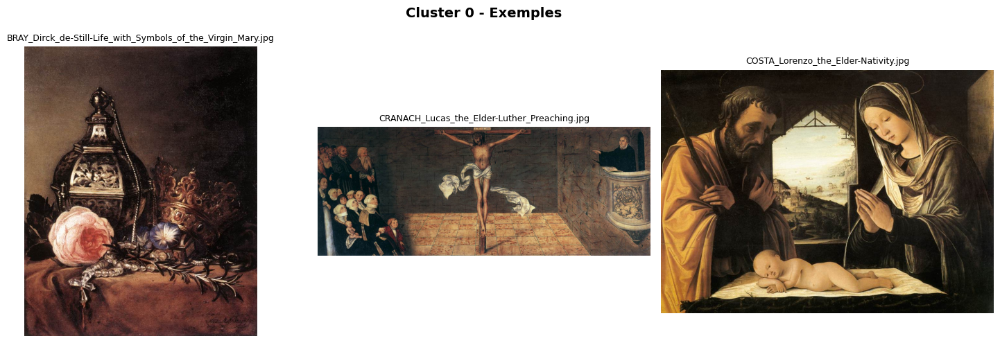

🎨 CLUSTER 1
Nombre d'images : 67
RGB moyen : (165, 151, 136)



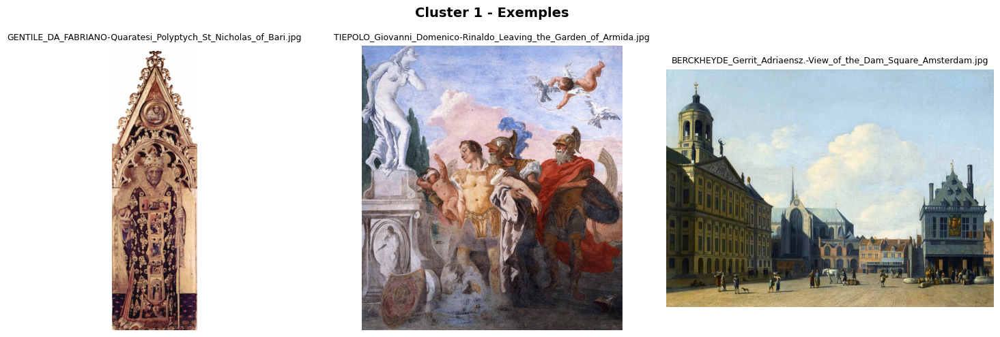

🎨 CLUSTER 2
Nombre d'images : 201
RGB moyen : (54, 41, 33)



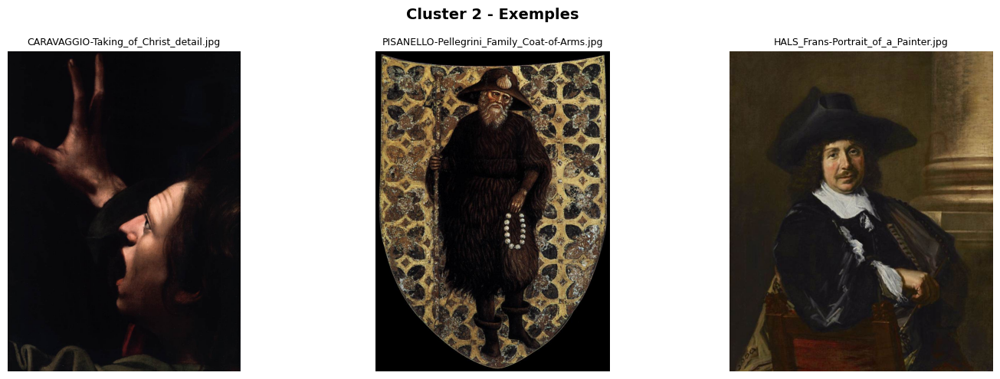

🎨 CLUSTER 3
Nombre d'images : 184
RGB moyen : (139, 120, 99)



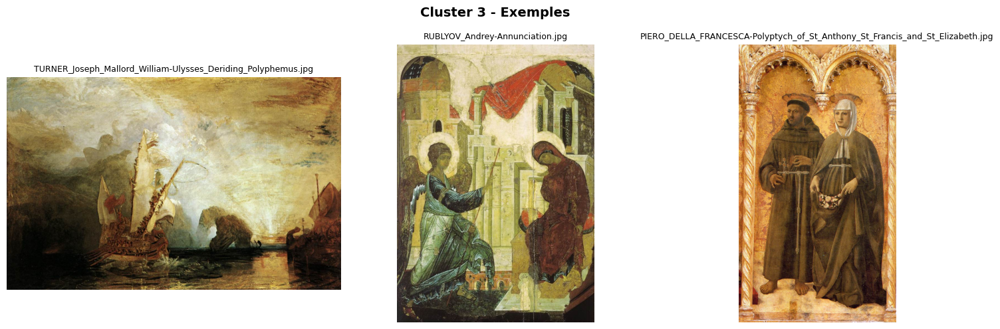

🎨 CLUSTER 4
Nombre d'images : 254
RGB moyen : (112, 91, 74)



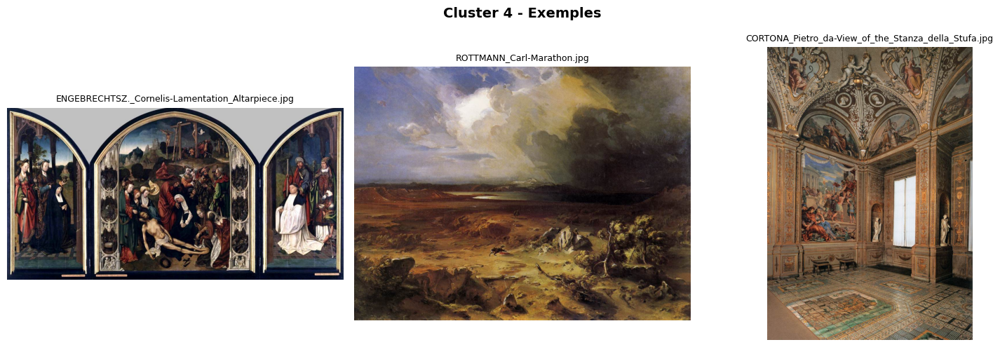

In [47]:
for i in range(n_clusters_rgb):
    visualize_cluster(i)